In [20]:
import os

import librosa
import librosa.display
import IPython.display
import numpy as np


import matplotlib.style as ms
import matplotlib.pyplot as plt
ms.use('seaborn-muted')
%matplotlib inline

In [10]:
# Load the example track
y, sr = librosa.load(librosa.util.example_audio_file(), sr=None)

In [11]:
# Play it back!
IPython.display.Audio(data=y, rate=sr)

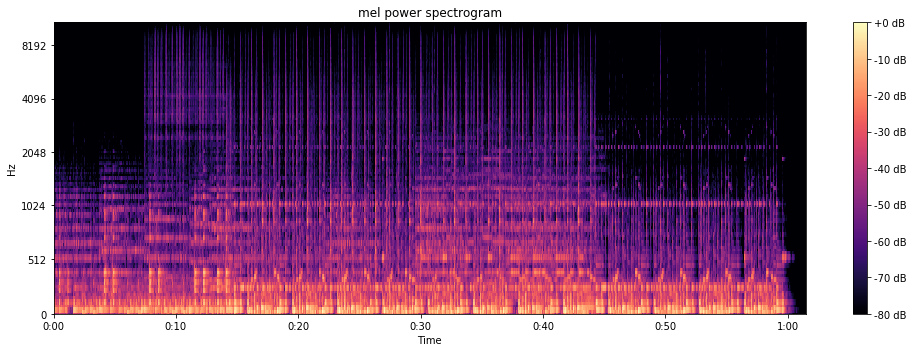

In [14]:
# Let's make and display a mel-scaled power (energy-squared) spectrogram
S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

# Convert to log scale (dB). We'll use the peak power (max) as reference.
log_S = librosa.power_to_db(S, ref=np.max)

# Make a new figure
plt.figure(figsize=(14,5))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

# Put a descriptive title on the plot
plt.title('mel power spectrogram')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

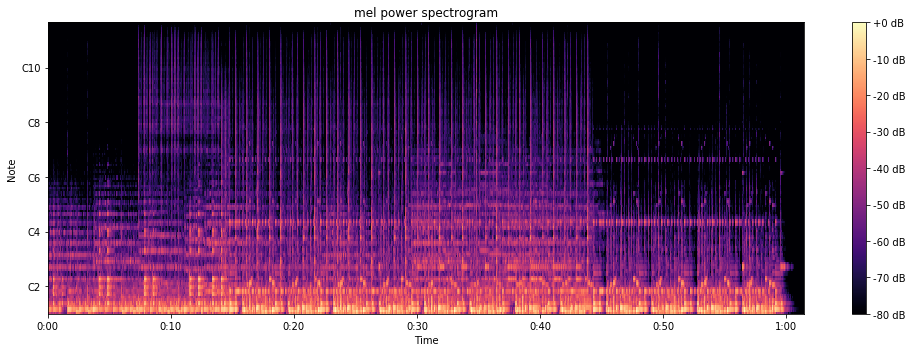

In [19]:
# Make a new figure
plt.figure(figsize=(14,5))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='cqt_note')

# Put a descriptive title on the plot
plt.title('mel power spectrogram')

# draw a color bar
plt.colorbar(format='%+02.0f dB')

# Make the figure layout compact
plt.tight_layout()

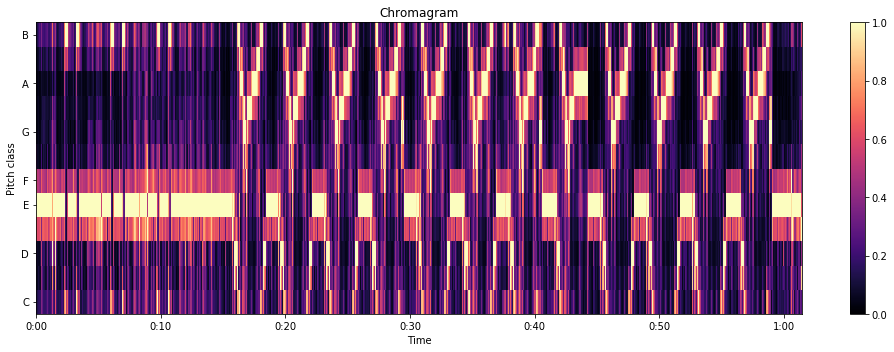

In [16]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

# We'll use a CQT-based chromagram here.  An STFT-based implementation also exists in chroma_cqt()
# We'll use the harmonic component to avoid pollution from transients
C = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)

# Make a new figure
plt.figure(figsize=(14,5))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()

## ReadFiles

In [31]:
dataset_dir = "../datasets/genres"
working_genres = [os.path.join(dataset_dir, dir_) for dir_ in ["pop", "blues", "metal", "hiphop", "rock"]]
working_genres

['../datasets/genres/pop',
 '../datasets/genres/blues',
 '../datasets/genres/metal',
 '../datasets/genres/hiphop',
 '../datasets/genres/rock']

In [32]:
for dir_path, _, fileNames in os.walk(dataset_dir):
    if dir_path not in working_genres:
        continue
    # Load musics
    for fileName in fileNames:
        y, sr = librosa.load(os.path.join(dir_path,fileName), sr=44100)
        print(y.shape)
        break
    break

(1323588,)


In [34]:
IPython.display.Audio(data=y, rate=sr)

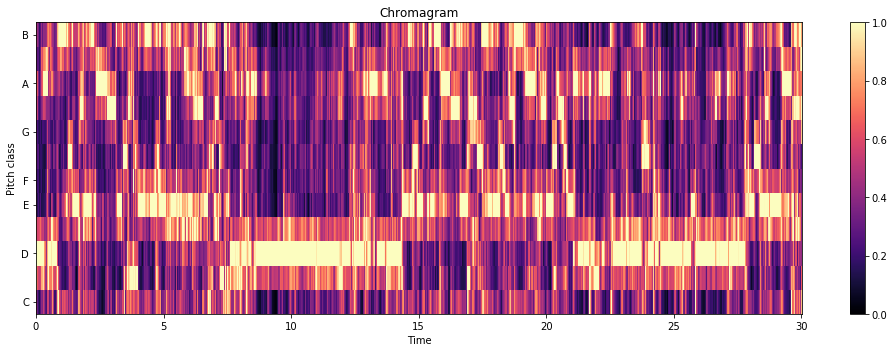

In [42]:
y_harmonic, y_percussive = librosa.effects.hpss(y)

# We'll use a CQT-based chromagram here.  An STFT-based implementation also exists in chroma_cqt()
# We'll use the harmonic component to avoid pollution from transients
C = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)

# Make a new figure
plt.figure(figsize=(14,5))

# Display the chromagram: the energy in each chromatic pitch class as a function of time
# To make sure that the colors span the full range of chroma values, set vmin and vmax
librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

plt.title('Chromagram')
plt.colorbar()

plt.tight_layout()


In [62]:
def get_Chromagram(y, gain, y_source='source', method='cqt', to_plot=True):
    if y_source == 'harmonic':
        # We'll use the harmonic component to avoid pollution from transients
        # y_harmonic, y_percussive = librosa.effects.hpss(y)
        y, _ = librosa.effects.hpss(y)
        
    if method == 'cqt': # We'll use a CQT-based chromagram here.
        # An STFT-based implementation also exists in chroma_cqt()
        C = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)
        plt_title = 'Chromagram('+method.upper()+')'
    elif method == 'clp':  # We'll use chromagram with logarithmic compression.
        S = np.abs(librosa.stft(y)) # spectragram with STFT
        C = librosa.feature.chroma_stft(S=np.log(1.0 + gain * S), sr=sr)
        plt_title = 'Chromagram('+method.upper()+') - γ='+str(gain)

    if to_plot:
        # Make a new figure
        plt.figure(figsize=(14,5))

        # Display the chromagram: the energy in each chromatic pitch class as a function of time
        # To make sure that the colors span the full range of chroma values, set vmin and vmax
        librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

        plt.title('Chromagram(CLP) - γ='+str(gain))
        plt.colorbar()
        plt.tight_layout()

    return C

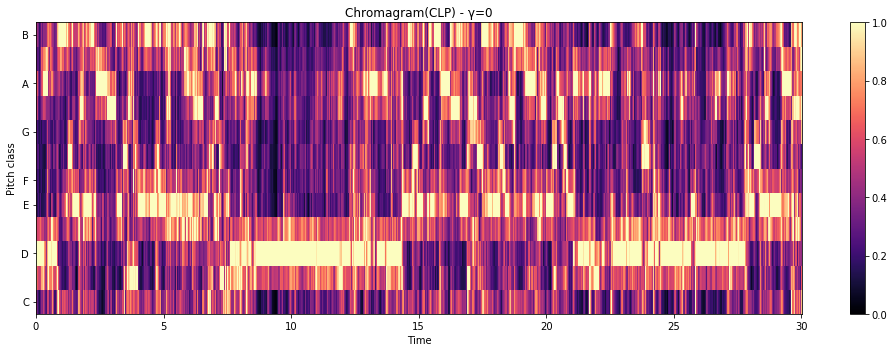

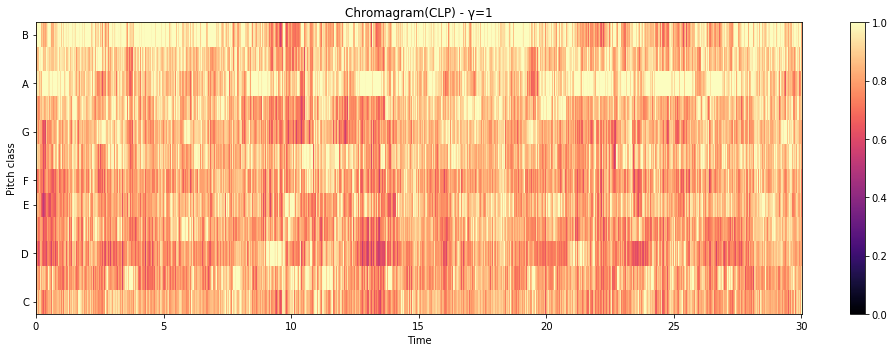

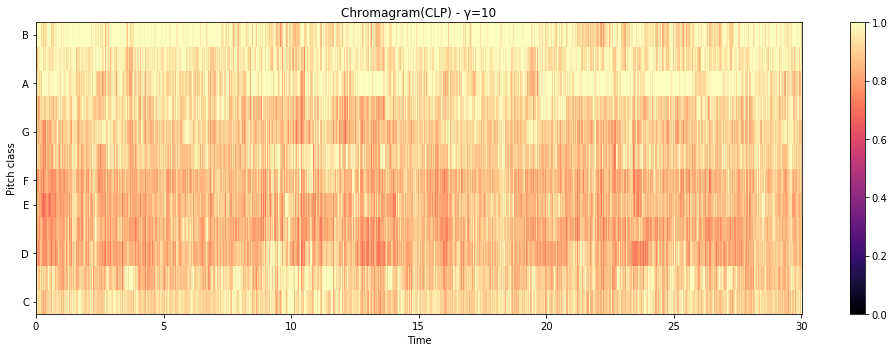

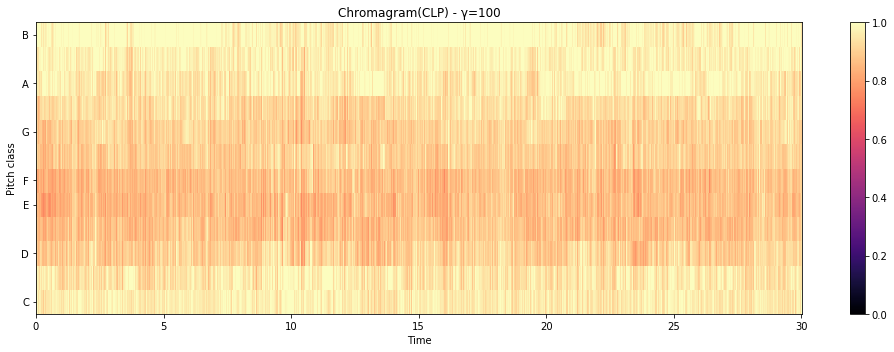

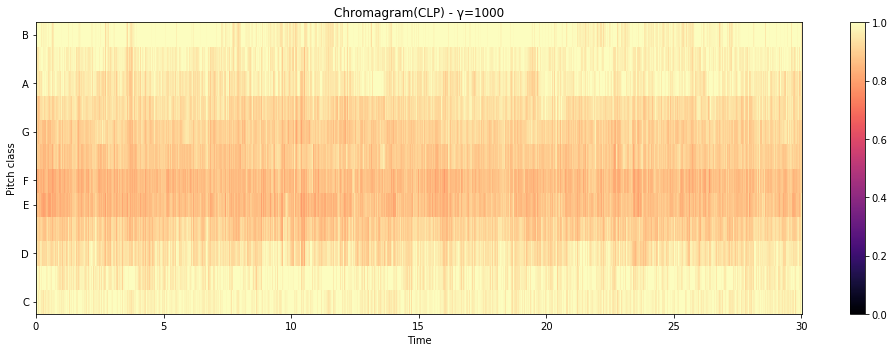

In [63]:
_ = get_Chromagram(y, 0, method='cqt')
_ = get_Chromagram(y, 1, method='clp')
_ = get_Chromagram(y, 10, method='clp')
_ = get_Chromagram(y, 100, method='clp')
_ = get_Chromagram(y, 1000, method='clp')